# minimum 'working' example


-  install drivers through pip in msys2
- run from here

In [ ]:
# artiq time

# we will use TTLs 12-15, 21-27

In [4]:
# this is just giving all the regular base environment packages
!pip list

Package                       Version        Editable project location
----------------------------- -------------- ------------------------------------------------------------
aiohttp                       3.8.1
aiosignal                     1.2.0
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
artiq                         8.9009+6f600dd
artiq-comtools                1.3
asttokens                     2.0.5
async-timeout                 4.0.2
attrs                         21.4.0
azure-core                    1.24.0
azure-identity                1.10.0
backcall                      0.2.0
backports.functools-lru-cache 1.6.4
bcrypt                        3.2.2
beautifulsoup4                4.11.1
bleach                        5.0.0
broadbean                     0.10.0
brotlipy                      0.7.0
cached-property               1.5.2
cachetools                    5.0.0
certifi                       2025.8.3
cffi                          1.15.0
charset-norma

In [5]:
import numpy as np

In [6]:
# IMPORTS
import qil_helpers.Ben.Holeburning as HB

In [7]:
# define a pair of channels

yourChannel = "ttl27" # use another channel here, or make a list of them
TTLChannels = ["ttl26", yourChannel]


In [8]:
#define a couple of states

stateOne    = HB.sequenceObject([0,1],'stateOne')
stateTwo    = HB.sequenceObject([1,0], 'stateTwo')
stateThree  = HB.sequenceObject([1,1], 'stateThree')
off   = HB.sequenceObject([0,0], 'off')


In [9]:
# define a pulsing state for funsies
pulseFrequency = 1e3 # in Hz

#up=HB.pulseObject([1,0,0,1,1],magicScaling*ACmoveFreq,[3],'up')
pulseState  = HB.pulseObject([0,0], pulseFrequency, [1],'pulsing')

#note the way this syntax works is it pulses the [1] indexed term in the prev. array

In [10]:
# build a sequence of sequence objects
timingOne = 1e-3  #in seconds 
numRepeats = 100

sequenceOne = {stateOne():timingOne,off():timingOne, stateTwo:timingOne, stateThree:timingOne,off():timingOne}
sequenceTwo = {stateOne():timingOne,pulseState():timingOne, HB.repSequence(sequenceOne):int(numRepeats)}

#note that the repsequence stuff is a bit of pain - you can't "call" sequenceOne there again, as it's already a dict.

In [11]:
sequenceTwo

{<qil_helpers.Ben.Holeburning.sequenceObject at 0x18e88d1bee0>: 0.001,
 <qil_helpers.Ben.Holeburning.pulseObject at 0x18e88d182e0>: 0.001,
 <qil_helpers.Ben.Holeburning.repSequence at 0x18e88d18c70>: 100}

In [12]:
# start making nice visualisable objects of the sequence you want to run
seqMatrix,prototype,timings = HB.sequenceMatrix(sequenceOne)
xCoords,yCoords = HB.visualiseSequenceMatrix((prototype.T).T,timings)

In [13]:
import matplotlib.pyplot as plt

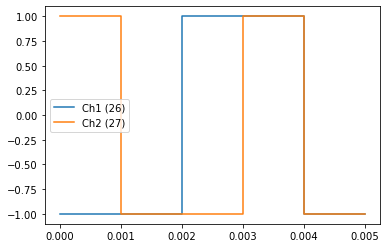

In [14]:
plt.plot(xCoords,yCoords)
plt.legend(["Ch1 (26)", "Ch2 (27)"])
#plt.legend(["A (30)","B (31)","Trig (29)","Step (28)"])

plt.show()

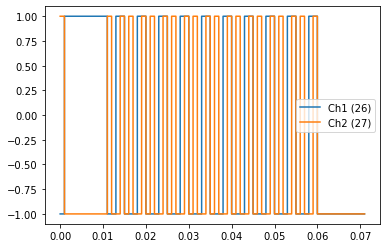

In [15]:
# start making nice visualisable objects of the sequence you want to run
totalTime = 0.01
sequenceTwo = {stateOne():1e-3, stateTwo():1e-2, HB.repSequence(sequenceOne):int(1e1), off():totalTime}

seqMatrix,prototype,timings = HB.sequenceMatrix(sequenceTwo)
xCoords,yCoords = HB.visualiseSequenceMatrix((prototype.T).T,timings)


plt.plot(xCoords, yCoords)
plt.legend(["Ch1 (26)", "Ch2 (27)"])


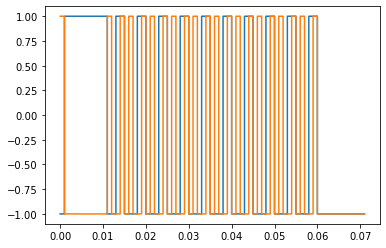

In [16]:
plt.plot(xCoords, yCoords)

# now to pass the sequence to the artique

In [1]:
import qil_artiq as artiq

In [2]:
from qil_artiq.artiq import ArtiqController, ArtiqClient


In [17]:
#artiqController=ArtiqController("../artiq")
artiqController=ArtiqClient()

In [18]:

# setTTLs=artiqController.initExperiment(fileName='set_ttls.py',className='setTTLs',defaultArgs=dict(sequence='[1,0,0]'))

args = dict(
        sequence_matrix = seqMatrix,
        channels=str(TTLChannels),
        continuous=False,
                      )
# we need to send some default args to the experiment, and these are as good as any:
# seqmatrix - the one we defined before
# a list of channels that we will work with 
# wehether or not it'll repeat


# tell the controller about this experiment.
setHBSequence=artiqController.initExperiment(fileName='TTL_sequence.py',className='TTLSequence',defaultArgs=args)
## filename = what is on diddykong and what it will run
## classname = the class within that file
## defaultargs - as above. 



In [37]:
artiqController.clearQueue()
# this is something we want to do less nowadays, given the number of users but could be useful when processes hang

KeyboardInterrupt: 

In [42]:
iSequence=HB.artiqSequence(sequenceTwo)
#generates a sequence_matrix




In [43]:
# THIS Spits a sequence matrix object to my locally running core analyzer 
# which then sends it to diddykong, who then sends it directly to the artiq.

# short version is that it sends it to the artiq
setHBSequence.run(sequence_matrix=iSequence)

[]


23609

In [45]:
# note now that while you're here, you could if you were REALLY excited about it, 
# do all that sequence generation programmatically, ina loop with some numbers generated 
# on the fly.
# 
numRepeats = (1e2)
loopLength = int(5)
for i in range(loopLength):
    newCounter = i
    sequenceTwo = {stateOne():1e-3, stateTwo():1e-2, HB.repSequence(sequenceOne):i*int(numRepeats), off():totalTime}

    #sequenceTwo = {stateOne():timingOne * newCounter,pulseState():timingOne, HB.repSequence(sequenceOne):int(numRepeats)}
    iSequence=HB.artiqSequence(sequenceTwo)
    setHBSequence.run(sequence_matrix=iSequence)



[]
[]
[]
[]
[]


In [40]:
artiqController.clearQueue()

SyntaxError: unmatched ']' (<string>, line 1)